# Important Libraries

In [1]:
import os
import random
from collections import Counter
from datetime import datetime

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

import tensorflow as tf
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img, save_img
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, GlobalMaxPooling2D, concatenate, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.mixed_precision import set_global_policy, LossScaleOptimizer
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.regularizers import l2

from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.scores import CategoricalScore
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

# Augmentation

## complex Augmentation

In [ ]:
import os
from keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, save_img
import numpy as np

# Define the path to your data and the path where you want to save the augmented data
data_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/color'
augmented_data_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/color_augmented'

# Create the augmented data directory if it doesn't exist
if not os.path.exists(augmented_data_path):
    os.makedirs(augmented_data_path)

# Initialize the image data generator with chosen augmentations
datagen = ImageDataGenerator(
    rotation_range=345,    # Wide rotation range (from 0 to 345 degrees)
    zoom_range=0.1,        # Very mild zoom range (up to 10% zoom in or out)
    width_shift_range=0.1, # Mild width shift (up to 10% of image width)
    height_shift_range=0.1,# Mild height shift (up to 10% of image height)
    fill_mode='constant',  # Fill mode set to constant to fill with black
    cval=0,                # Fill value set to black
    horizontal_flip=True,  # horizontal flip
    vertical_flip=True     # vertical flip
)

# Function to count images in each category
def count_images_in_category(category_path):
    return len([img_name for img_name in os.listdir(category_path) if img_name.endswith(('jpg', 'jpeg', 'png', 'bmp', 'tiff'))])

# Function to augment images
def augment_images(category_path, category_augmented_path, num_augments):
    for img_name in os.listdir(category_path):
        img_path = os.path.join(category_path, img_name)
        img = load_img(img_path)
        x = img_to_array(img)
        x = x.reshape((1,) + x.shape)

        # Create directory for the augmented images if it doesn't exist
        if not os.path.exists(category_augmented_path):
            os.makedirs(category_augmented_path)

        # Augment each image specified number of times
        augmented_images_count = 0
        for batch in datagen.flow(x, batch_size=1):
            augmented_img_path = os.path.join(category_augmented_path, f'aug_{augmented_images_count}_{img_name}')
            save_img(augmented_img_path, batch[0])
            augmented_images_count += 1
            if augmented_images_count >= num_augments:
                break

# Calculate the number of images in each category
category_image_counts = {}
for category in os.listdir(data_path):
    category_path = os.path.join(data_path, category)
    if os.path.isdir(category_path):
        category_image_counts[category] = count_images_in_category(category_path)

# Determine the maximum number of images in any category
max_images = max(category_image_counts.values())

# Iterate over each category and augment images if necessary
for category in os.listdir(data_path):
    category_path = os.path.join(data_path, category)
    category_augmented_path = os.path.join(augmented_data_path, category)
    
    if os.path.isdir(category_path):
        current_count = category_image_counts[category]
        if current_count < max_images:
            num_augments_needed = max_images - current_count
            num_augments_per_image = num_augments_needed // current_count + 1
            augment_images(category_path, category_augmented_path, num_augments_per_image)

print("Data augmentation completed!")

## Simple Augmentation

In [ ]:
# Define the path to your data and the path where you want to save the augmented data
data_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/color'
augmented_data_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/color_augmented'

# Create the augmented data directory if it doesn't exist
if not os.path.exists(augmented_data_path):
    os.makedirs(augmented_data_path)

# Define the specific augmentations to apply
augmentations = [
    {"flip_horizontal": False, "flip_vertical": False, "rotation": 0},
    {"flip_horizontal": True, "flip_vertical": False, "rotation": 0},
    {"flip_horizontal": False, "flip_vertical": True, "rotation": 0},
    {"flip_horizontal": True, "flip_vertical": True, "rotation": 0},
    {"flip_horizontal": False, "flip_vertical": False, "rotation": 90},
    {"flip_horizontal": True, "flip_vertical": False, "rotation": 90},
    {"flip_horizontal": False, "flip_vertical": True, "rotation": 90},
    {"flip_horizontal": True, "flip_vertical": True, "rotation": 90}
]

# Function to count images in each category
def count_images_in_category(category_path):
    images = [img_name for img_name in os.listdir(category_path) if img_name.lower().endswith(('jpg', 'jpeg', 'png', 'bmp', 'tiff'))]
    return len(images)

# Function to apply augmentation to an image
def augment_image(img, augment_params):
    if augment_params["flip_horizontal"]:
        img = np.fliplr(img)
    if augment_params["flip_vertical"]:
        img = np.flipud(img)
    if augment_params["rotation"] != 0:
        img = np.rot90(img, k=augment_params["rotation"] // 90)
    return img

# Function to augment images in a category
def augment_images_in_category(category_path, category_augmented_path, selected_images):
    total_augmented = 0
    for img_name in selected_images:
        img_path = os.path.join(category_path, img_name)
        img = load_img(img_path)
        x = img_to_array(img)
        
        for i, augment_params in enumerate(augmentations):
            augmented_img = augment_image(x, augment_params)
            augmented_img_path = os.path.join(category_augmented_path, f'aug_{total_augmented}_{img_name}')
            save_img(augmented_img_path, augmented_img)
            total_augmented += 1
            print(f"Image {img_name} augmented with: {augment_params}")  # Print the augmentation applied

# Calculate the number of images in each category
category_image_counts = {}
for category in os.listdir(data_path):
    category_path = os.path.join(data_path, category)
    if os.path.isdir(category_path):
        category_image_counts[category] = count_images_in_category(category_path)

# Determine the minimum number of images in any category
min_images = min(category_image_counts.values())

# Ensure at least 152 images in each category, but not more than the available images
target_images = min(152, min_images)

# Iterate over each category and augment images
for category in os.listdir(data_path):
    category_path = os.path.join(data_path, category)
    category_augmented_path = os.path.join(augmented_data_path, category)
    
    if os.path.isdir(category_path):
        if not os.path.exists(category_augmented_path):
            os.makedirs(category_augmented_path)
        img_names = [img_name for img_name in os.listdir(category_path) if img_name.lower().endswith(('jpg', 'jpeg', 'png', 'bmp', 'tiff'))]
        selected_img_names = random.sample(img_names, target_images)  # Randomly select 152 different images
        augment_images_in_category(category_path, category_augmented_path, selected_img_names)

print("Data augmentation completed!")

Category: Apple___Apple_scab, Number of images: 9506
Category: Apple___Black_rot, Number of images: 9447
Category: Apple___Cedar_apple_rust, Number of images: 9887
Category: Apple___healthy, Number of images: 9776
Category: Blueberry___healthy, Number of images: 9372
Category: Cherry_(including_sour)___healthy, Number of images: 9719
Category: Cherry_(including_sour)___Powdery_mildew, Number of images: 9885
Category: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot, Number of images: 9566
Category: Corn_(maize)___Common_rust_, Number of images: 9447
Category: Corn_(maize)___healthy, Number of images: 9322
Category: Corn_(maize)___Northern_Leaf_Blight, Number of images: 9555
Category: Grape___Black_rot, Number of images: 9419
Category: Grape___Esca_(Black_Measles), Number of images: 8907
Category: Grape___healthy, Number of images: 9906
Category: Grape___Leaf_blight_(Isariopsis_Leaf_Spot), Number of images: 10036
Category: Orange___Haunglongbing_(Citrus_greening), Number of images: 11

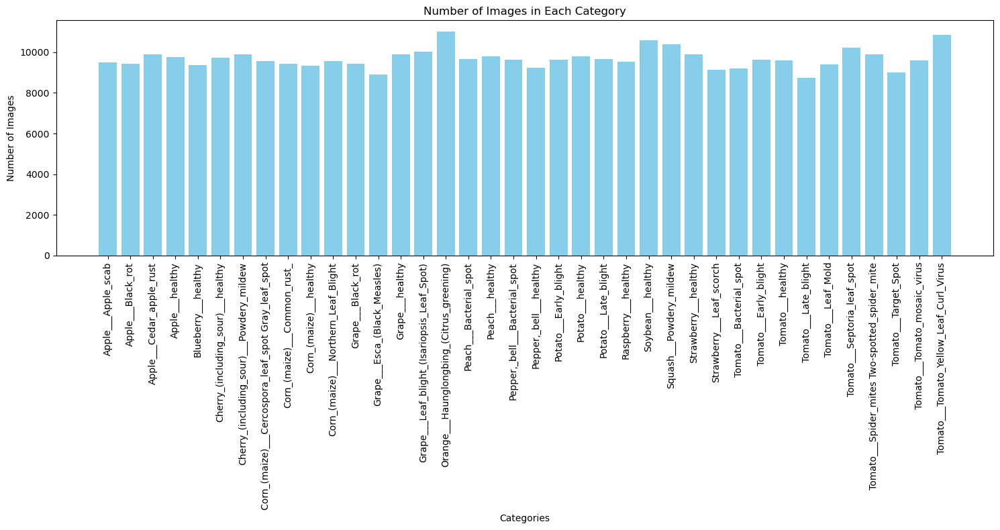

In [3]:
# Define the path to your data
data_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/merged_dataset'

# Function to count images in each category
def count_images_in_category(category_path):
    return len([img_name for img_name in os.listdir(category_path) if img_name.lower().endswith(('jpg', 'jpeg', 'png', 'bmp', 'tiff'))])

# Dictionary to hold the counts of images in each category
category_image_counts = {}

# Iterate over each category and count the images
for category in os.listdir(data_path):
    category_path = os.path.join(data_path, category)
    if os.path.isdir(category_path):
        category_image_counts[category] = count_images_in_category(category_path)

# Print the number of images in each subfolder
for category, count in category_image_counts.items():
    print(f"Category: {category}, Number of images: {count}")

# Plotting the results
categories = list(category_image_counts.keys())
counts = list(category_image_counts.values())

plt.figure(figsize=(15, 8))  # Increased figure size for better readability
plt.bar(categories, counts, color='skyblue')
plt.xlabel('Categories')
plt.ylabel('Number of Images')
plt.title('Number of Images in Each Category')
plt.xticks(rotation=90)
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
import os
import shutil

def merge_datasets(data_paths, output_path):
    # Ensure the output path exists
    if not os.path.exists(output_path):
        os.makedirs(output_path)

    for data_path in data_paths:
        subfolders = [f.path for f in os.scandir(data_path) if f.is_dir()]
        
        for subfolder in subfolders:
            subfolder_name = os.path.basename(subfolder)
            output_subfolder_path = os.path.join(output_path, subfolder_name)
            
            if not os.path.exists(output_subfolder_path):
                os.makedirs(output_subfolder_path)
            
            images = [f for f in os.listdir(subfolder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
            
            for img_name in images:
                img_path = os.path.join(subfolder, img_name)
                shutil.copy(img_path, output_subfolder_path)
                print(f"Copied {img_path} to {output_subfolder_path}")

data_paths = [
    'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/color_augmented',
    'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/VGG16_augmented'
]

output_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/merged_dataset'

merge_datasets(data_paths, output_path)
print("Merging completed.")

# VGG16

## 1. Load Data and Preprocess

In [2]:
# Paths
data_path = 'C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/merged_dataset'
image_size = (256, 256)
batch_size = 72

# Load all image paths and their corresponding labels
datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
data_generator = datagen.flow_from_directory(
    data_path,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False  # Ensure we get all data without shuffling
)

# Get file paths and labels
file_paths = np.array([os.path.join(data_path, fp) for fp in data_generator.filenames])
labels = np.array(data_generator.classes)

# Convert numerical labels to string format
label_strings = list(map(str, labels))

# Split the data into 50% training+validation and 50% testing
train_val_paths, test_paths, train_val_labels, test_labels = train_test_split(
    file_paths, label_strings, test_size=0.3, stratify=label_strings, random_state=42
)

# Further split the training+validation into 80% training and 20% validation
train_paths, val_paths, train_labels, val_labels = train_test_split(
    train_val_paths, train_val_labels, test_size=0.2, stratify=train_val_labels, random_state=42
)

# Create the training, validation, and test data generators
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
validation_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

# Training data generator
train_generator = train_datagen.flow_from_dataframe(
    dataframe=pd.DataFrame({'filename': train_paths, 'class': train_labels}),
    x_col='filename',
    y_col='class',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

# Validation data generator
validation_generator = validation_datagen.flow_from_dataframe(
    dataframe=pd.DataFrame({'filename': val_paths, 'class': val_labels}),
    x_col='filename',
    y_col='class',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

# Test data generator
test_generator = test_datagen.flow_from_dataframe(
    dataframe=pd.DataFrame({'filename': test_paths, 'class': test_labels}),
    x_col='filename',
    y_col='class',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Prefetching data for faster access
train_dataset = tf.data.Dataset.from_generator(lambda: train_generator, output_signature=(
    tf.TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32),
    tf.TensorSpec(shape=(None, len(train_generator.class_indices)), dtype=tf.float32)))
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

validation_dataset = tf.data.Dataset.from_generator(lambda: validation_generator, output_signature=(
    tf.TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32),
    tf.TensorSpec(shape=(None, len(validation_generator.class_indices)), dtype=tf.float32)))
validation_dataset = validation_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(labels), y=labels)
class_weights = dict(enumerate(class_weights))

Found 367818 images belonging to 38 classes.
Found 205977 validated image filenames belonging to 38 classes.
Found 51495 validated image filenames belonging to 38 classes.
Found 110346 validated image filenames belonging to 38 classes.


## 2. Build the Model

In [3]:
# Enable mixed precision
set_global_policy('mixed_float16')

# Load the VGG16 model pre-trained on ImageNet, without the top layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

# Add custom top layers
x_avg = GlobalAveragePooling2D()(base_model.output)
x_max = GlobalMaxPooling2D()(base_model.output)
x = concatenate([x_avg, x_max])

x = Dense(1024, activation='relu', kernel_regularizer=l2(0.001))(x)
#x = BatchNormalization()(x)
x = Dropout(0.2)(x)

x = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(x)
x = BatchNormalization()(x)
x = Dropout(0.2)(x)

num_classes = len(train_generator.class_indices)
predictions = Dense(num_classes, activation='softmax', dtype='float32')(x)  # Ensure output is float32

# Create the final model
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model with a mixed precision optimizer
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-3,
    decay_steps=10000,
    decay_rate=0.8)
base_optimizer = Adam(learning_rate=lr_schedule)
optimizer = tf.keras.mixed_precision.LossScaleOptimizer(base_optimizer)

# Compile the model
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Callbacks for early stopping and saving the best model
callbacks = [
    ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, verbose=1)
]

INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA GeForce RTX 3050 Ti Laptop GPU, compute capability 8.6


## 3. Train the Model

In [8]:
# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // batch_size,
    epochs=30,
    class_weight=class_weights,
    callbacks=callbacks
)

Epoch 1/30
2860/2860 [==============================] - 1091s 381ms/step - loss: 1.2037 - accuracy: 0.8048 - val_loss: 0.8778 - val_accuracy: 0.8361

Epoch 00001: val_loss improved from inf to 0.87776, saving model to best_model.h5
Epoch 2/30
2860/2860 [==============================] - 1086s 380ms/step - loss: 0.7946 - accuracy: 0.8460 - val_loss: 0.7020 - val_accuracy: 0.8650

Epoch 00002: val_loss improved from 0.87776 to 0.70198, saving model to best_model.h5
Epoch 3/30
2860/2860 [==============================] - 1088s 380ms/step - loss: 0.7152 - accuracy: 0.8562 - val_loss: 0.7088 - val_accuracy: 0.8535

Epoch 00003: val_loss did not improve from 0.70198
Epoch 4/30
2860/2860 [==============================] - 1086s 380ms/step - loss: 0.6555 - accuracy: 0.8646 - val_loss: 0.5954 - val_accuracy: 0.8803

Epoch 00004: val_loss improved from 0.70198 to 0.59540, saving model to best_model.h5
Epoch 5/30
2860/2860 [==============================] - 1085s 379ms/step - loss: 0.6203 - accur

In [50]:
# Save the entire model
model = load_model('best_model.h5', compile=False)

## 4. Evaluate the Model

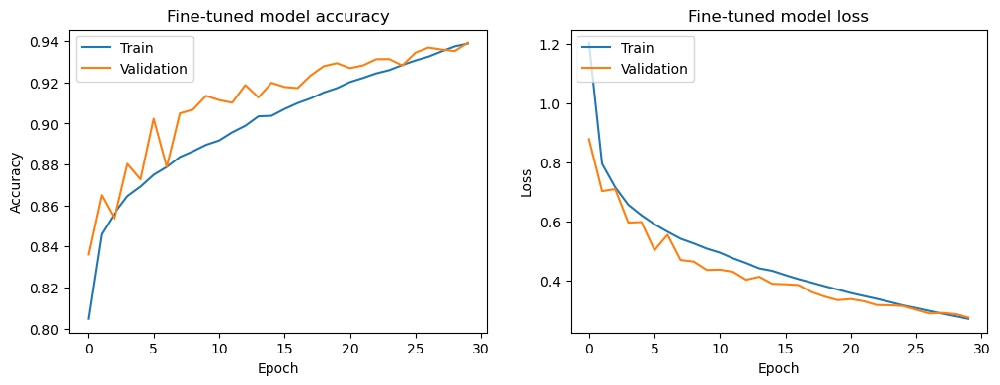

In [9]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Fine-tuned model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Fine-tuned model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

## 5. Visualization Part

### Confusion Matrix & Classification Report

Original class indices and their corresponding labels from data_generator:
Index: 0, Label: Apple___Apple_scab
Index: 1, Label: Apple___Black_rot
Index: 2, Label: Apple___Cedar_apple_rust
Index: 3, Label: Apple___healthy
Index: 4, Label: Blueberry___healthy
Index: 5, Label: Cherry_(including_sour)___Powdery_mildew
Index: 6, Label: Cherry_(including_sour)___healthy
Index: 7, Label: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Index: 8, Label: Corn_(maize)___Common_rust_
Index: 9, Label: Corn_(maize)___Northern_Leaf_Blight
Index: 10, Label: Corn_(maize)___healthy
Index: 11, Label: Grape___Black_rot
Index: 12, Label: Grape___Esca_(Black_Measles)
Index: 13, Label: Grape___Leaf_blight_(Isariopsis_Leaf_Spot)
Index: 14, Label: Grape___healthy
Index: 15, Label: Orange___Haunglongbing_(Citrus_greening)
Index: 16, Label: Peach___Bacterial_spot
Index: 17, Label: Peach___healthy
Index: 18, Label: Pepper,_bell___Bacterial_spot
Index: 19, Label: Pepper,_bell___healthy
Index: 20, Label: Potato_

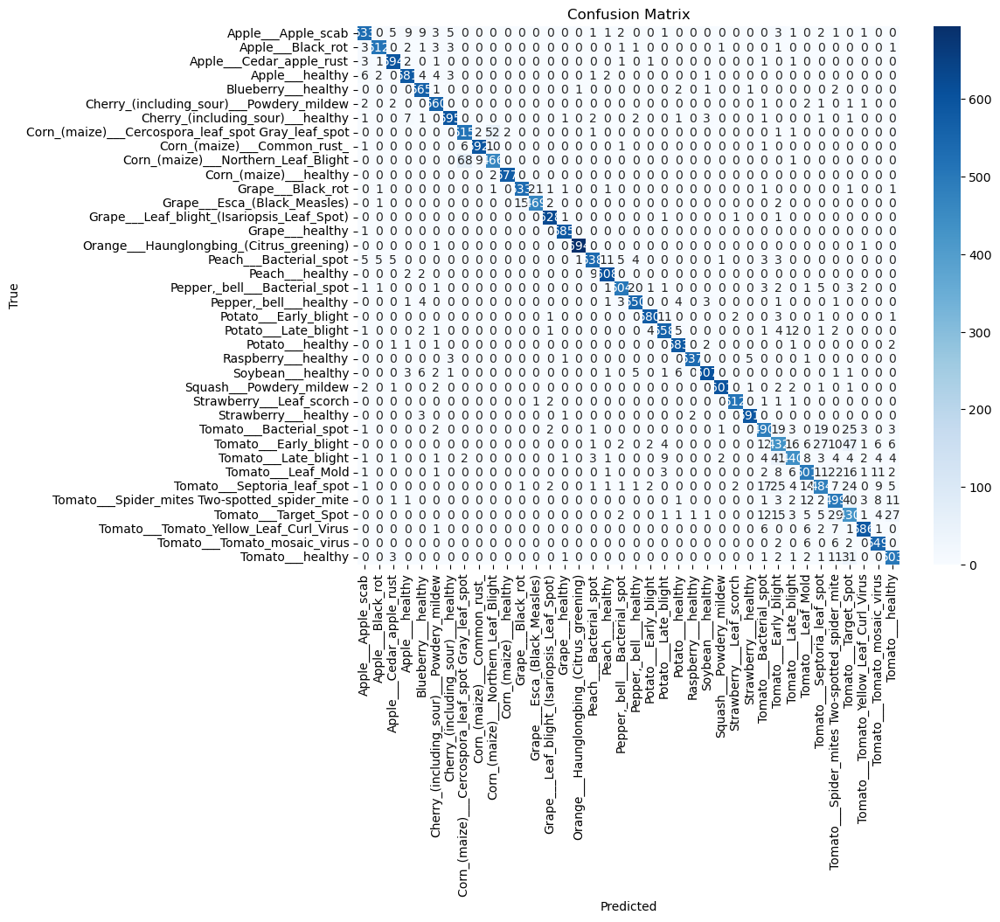

Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.95      0.92      0.94       577
                                 Apple___Black_rot       0.98      0.97      0.97       529
                          Apple___Cedar_apple_rust       0.97      0.98      0.98       605
                                   Apple___healthy       0.95      0.96      0.96       604
                               Blueberry___healthy       0.95      0.99      0.97       573
          Cherry_(including_sour)___Powdery_mildew       0.96      0.98      0.97       570
                 Cherry_(including_sour)___healthy       0.98      0.97      0.97       616
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.87      0.90      0.88       574
                       Corn_(maize)___Common_rust_       0.98      0.97      0.98       611
               Corn_(maize)___Northern_Leaf_Blight      

In [6]:
# Get class indices from the original data_generator (lexicographical order used during training)
class_indices_data_gen = data_generator.class_indices

# Get class indices from the train_generator used for actual training
class_indices_train_gen = train_generator.class_indices

# Invert the train_generator class indices for prediction mapping
index_to_label_train_gen = {v: k for k, v in class_indices_train_gen.items()}

# Invert the data_generator class indices to map back to class names
index_to_class_name = {v: k for k, v in class_indices_data_gen.items()}

# Display the class indices and their corresponding labels
print("Original class indices and their corresponding labels from data_generator:")
for index, label in index_to_class_name.items():
    print(f"Index: {index}, Label: {label}")

# Get 20% of the test set
test_size = len(test_paths)
subset_size = int(0.2 * test_size)
indices = np.random.choice(test_size, subset_size, replace=False)
test_subset_paths = np.array(test_paths)[indices]
test_subset_labels = np.array(test_labels)[indices]

# Create a data generator for the subset
test_subset_generator = test_datagen.flow_from_dataframe(
    dataframe=pd.DataFrame({'filename': test_subset_paths, 'class': test_subset_labels}),
    x_col='filename',
    y_col='class',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Make predictions on the test subset
test_subset_predictions = model.predict(test_subset_generator, steps=test_subset_generator.samples // batch_size + 1)

# Convert predictions and true labels to their original class labels using train_generator indices
predicted_indices = np.argmax(test_subset_predictions, axis=1)
true_indices = test_subset_generator.classes

# Map predicted indices to string labels using train_generator mapping
predicted_labels = [index_to_label_train_gen[idx] for idx in predicted_indices]

# Map predicted string labels to actual class names using data_generator mapping
predicted_class_names = [index_to_class_name[int(label)] for label in predicted_labels]

# Map true indices to string labels using train_generator mapping
true_labels = [index_to_label_train_gen[idx] for idx in true_indices]

# Map true string labels to actual class names using data_generator mapping
true_class_names = [index_to_class_name[int(label)] for label in true_labels]

# Generate confusion matrix
conf_matrix = confusion_matrix(true_class_names, predicted_class_names, labels=list(index_to_class_name.values()))

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=list(index_to_class_name.values()), yticklabels=list(index_to_class_name.values()))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Generate classification report
class_report = classification_report(true_class_names, predicted_class_names, target_names=list(index_to_class_name.values()))
print('Classification Report:')
print(class_report)

In [9]:
import numpy as np
import tkinter as tk
from tkinter import filedialog
from PIL import Image
from keras.preprocessing.image import img_to_array
from keras.applications.vgg16 import preprocess_input
from keras.models import load_model

# train_generator and data_generator are assumed to be previously defined in your setup
train_generator_class_indices = train_generator.class_indices
data_generator_class_indices = data_generator.class_indices

# Invert the class indices from the train_generator for prediction mapping
index_to_label_train_gen = {v: k for k, v in train_generator_class_indices.items()}

# Invert the class indices from the data_generator to map back to class names
index_to_class_name = {v: k for k, v in data_generator_class_indices.items()}

def predict_image(image_path):
    # Load and preprocess the image
    img = Image.open(image_path).convert('RGB')
    img = img.resize(image_size)
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    # Make prediction
    predictions = model.predict(img_array)
    predicted_class_index = np.argmax(predictions, axis=1)[0]
    
    # Map predicted index to the label used during training
    predicted_label = index_to_label_train_gen[predicted_class_index]

    # Map the label to the actual class name using the original data_generator mapping
    predicted_class_name = index_to_class_name[int(predicted_label)]

    print(f"Predicted Class: {predicted_class_name}")

def open_file_dialog():
    # Open a file dialog to select an image
    root = tk.Tk()
    root.withdraw()  # Hide the root window
    file_path = filedialog.askopenfilename(filetypes=[("Image files", "*.jpg *.jpeg *.png *.bmp *.tiff *.gif")])
    if file_path:
        print(f"Selected Image: {file_path}")
        predict_image(file_path)
    else:
        print("No file selected")

# Run the file dialog to predict the label of a selected image
open_file_dialog()

Selected Image: C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/merged_dataset/Potato___Early_blight/aug_4_7fb3dc5c-f90b-46fe-8eb6-2d21038976ff___RS_Early.B 7256_final_masked.jpg
Predicted Class: Potato___Early_blight


## 6. Interpretability

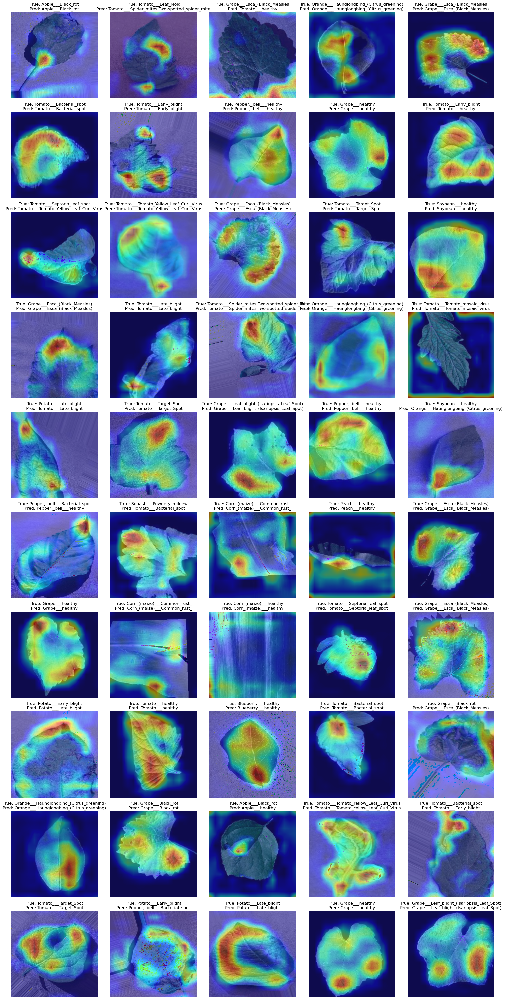

In [10]:
def visualize_predictions_with_gradcam(model, test_generator, train_generator, data_generator, num_images=50):
    # Get the class indices from both generators
    train_class_indices = train_generator.class_indices
    data_class_indices = data_generator.class_indices

    # Create mappings
    index_to_label_train = {v: k for k, v in train_class_indices.items()}
    index_to_class_name = {v: k for k, v in data_class_indices.items()}

    # Calculate the number of batches needed to get the desired number of images
    num_batches = (num_images // test_generator.batch_size) + 1
    images, labels = [], []

    # Collect the required number of images and labels
    for _ in range(num_batches):
        batch_images, batch_labels = next(test_generator)
        images.append(batch_images)
        labels.append(batch_labels)

    # Concatenate the collected batches
    images = np.concatenate(images)[:num_images]
    labels = np.concatenate(labels)[:num_images]

    # Initialize Grad-CAM
    gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=True)

    # Create a figure to display the images
    plt.figure(figsize=(20, 40))

    for i in range(num_images):
        img = images[i]
        true_label_index = np.argmax(labels[i])
        
        # Get the true label name using the mappings
        true_label = index_to_label_train[true_label_index]
        true_label_name = index_to_class_name[int(true_label)]

        # Preprocess the image for prediction
        img_expanded = np.expand_dims(img, axis=0)
        img_preprocessed = preprocess_input(img_expanded)

        # Predict the label
        predictions = model.predict(img_preprocessed)
        predicted_label_index = np.argmax(predictions, axis=1)[0]

        # Get the predicted label name using the mappings
        predicted_label = index_to_label_train[predicted_label_index]
        predicted_label_name = index_to_class_name[int(predicted_label)]

        # Generate Grad-CAM heatmap
        score = CategoricalScore(predicted_label_index)
        cam = gradcam(score, img_expanded)[0]

        # Display the image with Grad-CAM
        plt.subplot(10, 5, i + 1)
        plt.imshow(img.astype("uint8"))
        plt.imshow(cam, cmap='jet', alpha=0.5)  # Overlay Grad-CAM heatmap
        plt.title(f"True: {true_label_name}\nPred: {predicted_label_name}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage:
# Assuming class_labels is a dictionary that maps indices to class names
visualize_predictions_with_gradcam(model, test_generator, train_generator, data_generator, num_images=50)

In [11]:
def visualize_predictions_with_gradcam(model, test_generator, train_generator, data_generator, num_images=10):
    # Get the class indices from both generators
    train_class_indices = train_generator.class_indices
    data_class_indices = data_generator.class_indices

    # Create mappings
    index_to_label_train = {v: k for k, v in train_class_indices.items()}
    index_to_class_name = {v: k for k, v in data_class_indices.items()}

    # Calculate the number of batches needed to get the desired number of images
    num_batches = (num_images // test_generator.batch_size) + 1
    images, labels = [], []

    # Collect the required number of images and labels
    for _ in range(num_batches):
        batch_images, batch_labels = next(test_generator)
        images.append(batch_images)
        labels.append(batch_labels)

    # Concatenate the collected batches
    images = np.concatenate(images)[:num_images]
    labels = np.concatenate(labels)[:num_images]

    # Initialize Grad-CAM
    gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=True)

    for i in range(num_images):
        img = images[i]
        true_label_index = np.argmax(labels[i])

        # Get the true label name using the mappings
        true_label = index_to_label_train[true_label_index]
        true_label_name = index_to_class_name[int(true_label)]

        # Preprocess the image for prediction
        img_expanded = np.expand_dims(img, axis=0)
        img_preprocessed = preprocess_input(img_expanded)

        # Predict the label
        predictions = model.predict(img_preprocessed)
        predicted_label_index = np.argmax(predictions, axis=1)[0]

        # Get the predicted label name using the mappings
        predicted_label = index_to_label_train[predicted_label_index]
        predicted_label_name = index_to_class_name[int(predicted_label)]

        # Generate Grad-CAM heatmap
        score = CategoricalScore(predicted_label_index)
        cam = gradcam(score, img_expanded)[0]

        # Create a figure to display the image and Grad-CAM heatmap side by side
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        
        # Display the original image
        axes[0].imshow(img.astype("uint8"))
        axes[0].set_title(f"True: {true_label_name}")
        axes[0].axis('off')

        # Display the Grad-CAM heatmap
        axes[1].imshow(img.astype("uint8"))
        axes[1].imshow(cam, cmap='jet', alpha=0.5)  # Overlay Grad-CAM heatmap
        axes[1].set_title(f"Pred: {predicted_label_name}")
        axes[1].axis('off')

        # Save the figure
        plt.tight_layout()
        plt.savefig(f"gradcam_output_{i+1}.png")
        plt.close()

# Example usage:
# Assuming test_generator, train_generator, and data_generator are your ImageDataGenerator instances
visualize_predictions_with_gradcam(model, test_generator, train_generator, data_generator, num_images=50)

Selected Image: C:/Users/kheir/Downloads/PlantRecognition/plantvillage dataset/merged_dataset/Soybean___healthy/aug_0_fc60273f-9361-41d8-9af5-51aca1e8175a___RS_HL 4170_final_masked.jpg
Predicted Class: Soybean___healthy


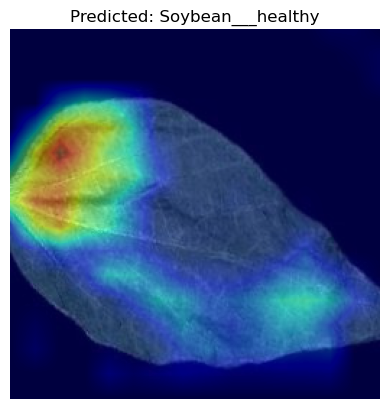

In [49]:
# Define class mappings
train_generator_class_indices = train_generator.class_indices
data_generator_class_indices = data_generator.class_indices

# Invert the class indices for prediction mapping
index_to_label_train_gen = {v: k for k, v in train_generator_class_indices.items()}
index_to_class_name = {v: k for k, v in data_generator_class_indices.items()}

def predict_image(image_path):
    # Load and preprocess the image
    img = Image.open(image_path).convert('RGB')
    img = img.resize(image_size)
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    # Make prediction
    predictions = model.predict(img_array)
    predicted_class_index = np.argmax(predictions, axis=1)[0]
    
    # Map predicted index to the label used during training
    predicted_label = index_to_label_train_gen[predicted_class_index]

    # Map the label to the actual class name using the original data_generator mapping
    predicted_class_name = index_to_class_name[int(predicted_label)]

    print(f"Predicted Class: {predicted_class_name}")

    # Generate Grad-CAM heatmap
    generate_gradcam(image_path, predicted_class_name)

def generate_gradcam(image_path, predicted_class_name):
    # Load and preprocess the image
    img = Image.open(image_path).convert('RGB')
    img = img.resize(image_size)
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)

    # Initialize Grad-CAM
    gradcam = Gradcam(model, model_modifier=ReplaceToLinear(), clone=True)

    # Find the predicted class index from the name for Grad-CAM
    predicted_class_index = list(data_generator_class_indices.keys()).index(predicted_class_name)

    # Create a score for the predicted class
    score = CategoricalScore(predicted_class_index)

    # Generate Grad-CAM heatmap
    cam = gradcam(score, img_array)[0]

    # Display the image with Grad-CAM
    plt.imshow(img_array[0].astype("uint8"))
    plt.imshow(cam, cmap='jet', alpha=0.5)  # Overlay Grad-CAM heatmap
    plt.title(f"Predicted: {predicted_class_name}")
    plt.axis('off')
    plt.show()

def open_file_dialog():
    # Open a file dialog to select an image
    root = tk.Tk()
    root.withdraw()  # Hide the root window
    file_path = filedialog.askopenfilename(filetypes=[("Image files", "*.jpg *.jpeg *.png *.bmp *.tiff *.gif")])
    if file_path:
        print(f"Selected Image: {file_path}")
        predict_image(file_path)
    else:
        print("No file selected")

# Run the file dialog to predict the label of a selected image
open_file_dialog()